In [635]:
!pip install -U fortran-magic
%matplotlib inline
%load_ext fortranmagic

import sys; sys.path.append('..')

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

mpl.rc('figure', figsize=(12, 7))

ran_the_first_cell = True

jan2017 = pd.to_datetime(['2017-01-03 00:00:00+00:00',
 '2017-01-04 00:00:00+00:00',
 '2017-01-05 00:00:00+00:00',
 '2017-01-06 00:00:00+00:00',
 '2017-01-09 00:00:00+00:00',
 '2017-01-10 00:00:00+00:00',
 '2017-01-11 00:00:00+00:00',
 '2017-01-12 00:00:00+00:00',
 '2017-01-13 00:00:00+00:00',
 '2017-01-17 00:00:00+00:00',
 '2017-01-18 00:00:00+00:00',
 '2017-01-19 00:00:00+00:00',
 '2017-01-20 00:00:00+00:00',
 '2017-01-23 00:00:00+00:00',
 '2017-01-24 00:00:00+00:00',
 '2017-01-25 00:00:00+00:00',
 '2017-01-26 00:00:00+00:00',
 '2017-01-27 00:00:00+00:00',
 '2017-01-30 00:00:00+00:00',
 '2017-01-31 00:00:00+00:00',
 '2017-02-01 00:00:00+00:00'])
calendar = jan2017.values.astype('datetime64[D]')

event_dates = pd.to_datetime(['2017-01-06 00:00:00+00:00', 
                             '2017-01-07 00:00:00+00:00', 
                             '2017-01-08 00:00:00+00:00']).values.astype('datetime64[D]')
event_values = np.array([10, 15, 20])

The fortranmagic extension is already loaded. To reload it, use:
  %reload_ext fortranmagic


**My own example 1**

In [636]:
event_dates_1 = pd.to_datetime(['2017-01-09 00:00:00+00:00', 
                             '2017-01-10 00:00:00+00:00', 
                             '2017-01-11 00:00:00+00:00']).values.astype('datetime64[D]')
event_values_1 = np.array([10, 15, 20])

<center>
  <h1>The PyData Toolbox</h1>
  <h3>Scott Sanderson (Twitter: @scottbsanderson, GitHub: ssanderson)</h3>
  <h3><a href="https://github.com/ssanderson/pydata-toolbox">https://github.com/ssanderson/pydata-toolbox</a></h3>
</center>

# About Me:

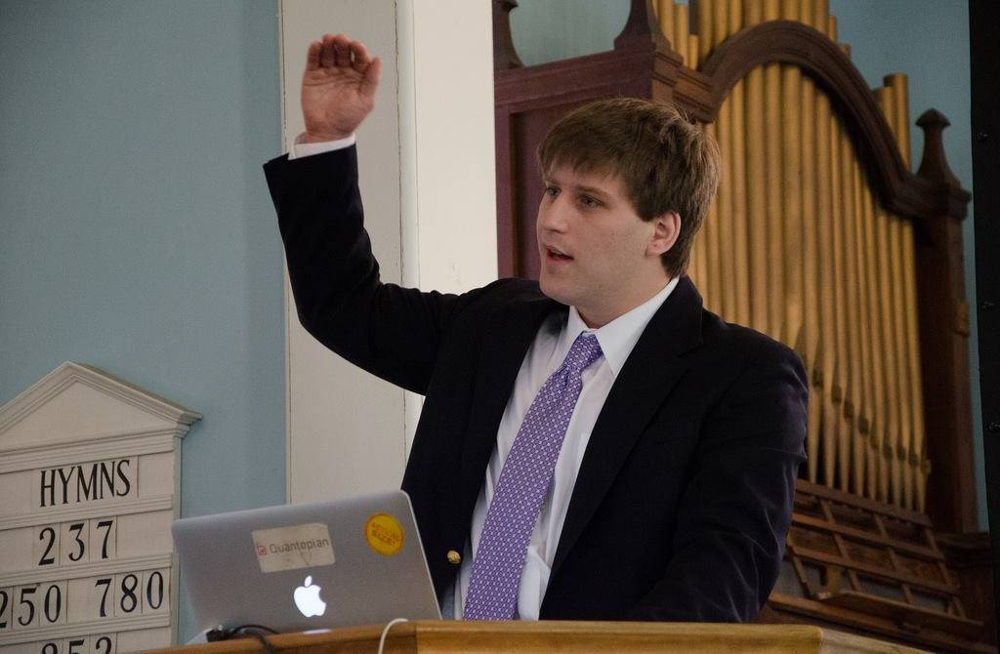

- Senior Engineer at [Quantopian](www.quantopian.com)
- Background in Mathematics and Philosophy
- **Twitter:** [@scottbsanderson](https://twitter.com/scottbsanderson)
- **GitHub:** [ssanderson](github.com/ssanderson)

## Outline

- Built-in Data Structures
- Numpy `array`
- Pandas `Series`/`DataFrame`
- Plotting and "Real-World" Analyses

# Data Structures

> Rule 5. Data dominates. If you've chosen the right data structures and organized things well, the algorithms
will almost always be self-evident. Data structures, not algorithms, are central to programming.

- *Notes on Programming in C*, by Rob Pike.

# Lists

In [637]:
assert ran_the_first_cell, "Oh noes!"

In [638]:
l = [1, 'two', 3.0, 4, 5.0, "six"]
l

[1, 'two', 3.0, 4, 5.0, 'six']

**My own example 2**

In [639]:
años = ['2010', '2011', 2012, '2013', '2014', '2015', '2016', '2017', '2018', '2019', 2020, 2021]
años

['2010',
 '2011',
 2012,
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2018',
 '2019',
 2020,
 2021]

In [640]:
# Lists can be indexed like C-style arrays.
first = l[0]
second = l[1]
print("first:", first)
print("second:", second)

first: 1
second: two


**My own example 3**

In [641]:
first_2 = años[0]
last_2 = años[11]
print("first:", first_2)
print("last:", last_2)

first: 2010
last: 2021


In [642]:
# Negative indexing gives elements relative to the end of the list.
last = l[-1]
penultimate = l[-2]
print("last:", last)
print("second to last:", penultimate)

last: six
second to last: 5.0


**My own example 4**

In [643]:
last = años[-1]
four_to_last = años[-4]
print("last:", last)
print("four to last:", four_to_last)

last: 2021
four to last: 2018


In [644]:
# Lists can also be sliced, which makes a copy of elements between 
# start (inclusive) and stop (exclusive)
sublist = l[1:3]
sublist

['two', 3.0]

**My own example 5**

In [645]:
sublist_2 = años[6:10]
sublist_2

['2016', '2017', '2018', '2019']

In [646]:
# l[:N] is equivalent to l[0:N].
first_three = l[:3]
first_three

[1, 'two', 3.0]

**My own example 6**

In [647]:
first_five = años[:5]
first_five

['2010', '2011', 2012, '2013', '2014']

In [648]:
# l[3:] is equivalent to l[3:len(l)].
after_three = l[3:]
after_three

[4, 5.0, 'six']

**My own example 7**

In [649]:
after_seven = años[7:]
after_seven

['2017', '2018', '2019', 2020, 2021]

In [650]:
# There's also a third parameter, "step", which gets every Nth element.
l = ['a', 'b', 'c', 'd', 'e', 'f', 'g','h']
l[1:7:2]

['b', 'd', 'f']

**My own example 8**

In [651]:
amigos = ['Paola', 'Luisa', 'Lucia', 'Fabio', 'Valentina', 'Laura','Gabriela', 'Jhon', 'Freddy', 'Lia']
amigos[1:8:3]

['Luisa', 'Valentina', 'Jhon']

In [652]:
# This is a cute way to reverse a list.
l[::-1]

['h', 'g', 'f', 'e', 'd', 'c', 'b', 'a']

**My own example 9**

In [653]:
amigos[::-1]

['Lia',
 'Freddy',
 'Jhon',
 'Gabriela',
 'Laura',
 'Valentina',
 'Fabio',
 'Lucia',
 'Luisa',
 'Paola']

In [654]:
# Lists can be grown efficiently (in O(1) amortized time).
l = [1, 2, 3, 4, 5]
print("Before:", l)
l.append('six')
print("After:", l)

Before: [1, 2, 3, 4, 5]
After: [1, 2, 3, 4, 5, 'six']


**My own example 10**

In [655]:
colores = ['amarillo', 'azul', 'negro', 'blaco']
print("Before:", colores)
colores.append('rojo')
print("After:", colores)

Before: ['amarillo', 'azul', 'negro', 'blaco']
After: ['amarillo', 'azul', 'negro', 'blaco', 'rojo']


In [656]:
# Comprehensions let us perform elementwise computations.
l = [1, 2, 3, 4, 5]
[x * 2 for x in l]

[2, 4, 6, 8, 10]

**My own example 11**

In [657]:
odd_nums = [1, 3, 5, 7, 9]
[(x * 3) - 1 for x in odd_nums]

[2, 8, 14, 20, 26]

## Review: Python Lists

- Zero-indexed sequence of arbitrary Python values.
- Slicing syntax: `l[start:stop:step]` copies elements at regular intervals from `start` to `stop`.
- Efficient (`O(1)`) appends and removes from end.
- Comprehension syntax: `[f(x) for x in l if cond(x)]`.

# Dictionaries

In [658]:
# Dictionaries are key-value mappings.
philosophers = {'David': 'Hume', 'Immanuel': 'Kant', 'Bertrand': 'Russell'}
philosophers

{'Bertrand': 'Russell', 'David': 'Hume', 'Immanuel': 'Kant'}

**My own example 12**

In [659]:
nums = {1:'Uno', 2: 'Dos', 3: 'Tres'}
nums

{1: 'Uno', 2: 'Dos', 3: 'Tres'}

In [660]:
# Like lists, dictionaries are size-mutable.
philosophers['Ludwig'] = 'Wittgenstein'
philosophers

{'Bertrand': 'Russell',
 'David': 'Hume',
 'Immanuel': 'Kant',
 'Ludwig': 'Wittgenstein'}

**My own example 13**

In [661]:
nums[4] = 'Cuatro'
nums

{1: 'Uno', 2: 'Dos', 3: 'Tres', 4: 'Cuatro'}

In [662]:
del philosophers['David']
philosophers

{'Bertrand': 'Russell', 'Immanuel': 'Kant', 'Ludwig': 'Wittgenstein'}

**My own example 14**

In [663]:
del nums[2]
nums

{1: 'Uno', 3: 'Tres', 4: 'Cuatro'}

In [664]:
# No slicing.
#philosophers['Bertrand':'Immanuel'] 

**My own example 15**

In [665]:
#nums[1:4]

## Review: Python Dictionaries

- Unordered key-value mapping from (almost) arbitrary keys to arbitrary values.
- Efficient (`O(1)`) lookup, insertion, and deletion.
- No slicing (would require a notion of order).

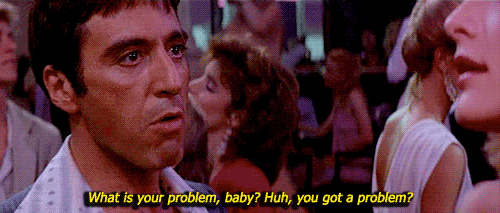


In [666]:
# Suppose we have some matrices...
a = [[1, 2, 3],
     [2, 3, 4],
     [5, 6, 7],
     [1, 1, 1]]

b = [[1, 2, 3, 4],
     [2, 3, 4, 5]]

**My own example 16**

In [667]:
c = [[1, 2, 3],
     [4, 5, 6],
     [7, 8, 9]]

d = [[5, 7, 3],
     [9, 6, 4]]

In [668]:
def matmul(A, B):
    """Multiply matrix A by matrix B."""
    rows_out = len(A)
    cols_out = len(B[0])
    out = [[0 for col in range(cols_out)] for row in range(rows_out)]
    
    for i in range(rows_out):
        for j in range(cols_out):
            for k in range(len(B)):
                out[i][j] += A[i][k] * B[k][j]
    return out

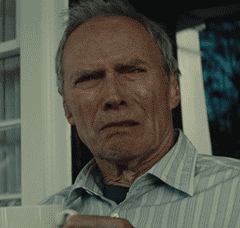


In [669]:
%%time

matmul(a, b)

CPU times: user 39 µs, sys: 2 µs, total: 41 µs
Wall time: 46.5 µs


[[5, 8, 11, 14], [8, 13, 18, 23], [17, 28, 39, 50], [3, 5, 7, 9]]

**My own example 17**

In [670]:
%%time

matmul(c, d)

CPU times: user 33 µs, sys: 2 µs, total: 35 µs
Wall time: 39.1 µs


[[23, 19, 11], [65, 58, 32], [107, 97, 53]]

In [671]:
import random
def random_matrix(m, n):
    out = []
    for row in range(m):
        out.append([random.random() for _ in range(n)])
    return out

randm = random_matrix(2, 3)
randm

[[0.47320347601832613, 0.14776044631440755, 0.3759458668745562],
 [0.6539511674901275, 0.4169712003891036, 0.49860166829468155]]

**My own example 18**

In [672]:
randm_2 = random_matrix(3, 4)
randm_2

[[0.713907532912911,
  0.620364825485144,
  0.2674516035682585,
  0.6866143073275844],
 [0.8380663050475338,
  0.09705228867191662,
  0.04725737802124608,
  0.2620337033054563],
 [0.1007302655512925,
  0.36973895923318645,
  0.38566854988610255,
  0.3918452813314801]]

In [673]:
%%time
randa = random_matrix(600, 100)
randb = random_matrix(100, 600)
x = matmul(randa, randb)

CPU times: user 16.5 s, sys: 68.9 ms, total: 16.5 s
Wall time: 22.3 s


**My own example 19**

In [674]:
%%time
randc = random_matrix(400, 100)
randd = random_matrix(100, 400)
x = matmul(randc, randd)

CPU times: user 5.5 s, sys: 9.1 ms, total: 5.51 s
Wall time: 6.56 s


In [675]:
# Maybe that's not that bad?  Let's try a simpler case.
def python_dot_product(xs, ys):
    return sum(x * y for x, y in zip(xs, ys))

In [676]:
%%fortran
subroutine fortran_dot_product(xs, ys, result)
    double precision, intent(in) :: xs(:)
    double precision, intent(in) :: ys(:)
    double precision, intent(out) :: result
    
    result = sum(xs * ys)
end

In [677]:
list_data = [float(i) for i in range(100000)]
array_data = np.array(list_data)

**My own example 20**

In [678]:
list_data_2 = [float(i) for i in range(365)]
array_data_2 = np.array(list_data)

In [679]:
%%time
python_dot_product(list_data, list_data)

CPU times: user 12.4 ms, sys: 0 ns, total: 12.4 ms
Wall time: 12.4 ms


333328333350000.0

**My own example 21**

In [680]:
%%time
python_dot_product(list_data_2, list_data_2)

CPU times: user 62 µs, sys: 3 µs, total: 65 µs
Wall time: 69.6 µs


16142490.0

In [681]:
%%time
fortran_dot_product(array_data, array_data)

CPU times: user 200 µs, sys: 0 ns, total: 200 µs
Wall time: 232 µs


333328333350000.0

**My own example 22**

In [682]:
%%time
fortran_dot_product(array_data_2, array_data_2)

CPU times: user 199 µs, sys: 10 µs, total: 209 µs
Wall time: 219 µs


333328333350000.0

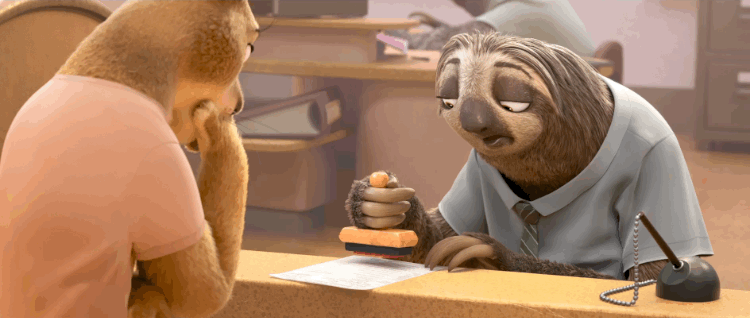


## Why is the Python Version so Much Slower?

In [683]:
# Dynamic typing.
def mul_elemwise(xs, ys):
    return [x * y for x, y in zip(xs, ys)]

mul_elemwise([1, 2, 3, 4], [1, 2 + 0j, 3.0, 'four'])
#[type(x) for x in _]

[1, (4+0j), 9.0, 'fourfourfourfour']

**My own example 23**

In [684]:
mul_elemwise([7, 8, 9, 10], [1, 2 + 0j, 3.0, 'four'])

[7, (16+0j), 27.0, 'fourfourfourfourfourfourfourfourfourfour']

In [685]:
# Interpretation overhead.
source_code = 'a + b * c'
bytecode = compile(source_code, '', 'eval')
import dis; dis.dis(bytecode)

  1           0 LOAD_NAME                0 (a)
              2 LOAD_NAME                1 (b)
              4 LOAD_NAME                2 (c)
              6 BINARY_MULTIPLY
              8 BINARY_ADD
             10 RETURN_VALUE


**My own example 24**

In [686]:
source_code = 'False + (a*b) * c/3'
bytecode = compile(source_code, '', 'eval')
import dis; dis.dis(bytecode)

  1           0 LOAD_CONST               0 (False)
              2 LOAD_NAME                0 (a)
              4 LOAD_NAME                1 (b)
              6 BINARY_MULTIPLY
              8 LOAD_NAME                2 (c)
             10 BINARY_MULTIPLY
             12 LOAD_CONST               1 (3)
             14 BINARY_TRUE_DIVIDE
             16 BINARY_ADD
             18 RETURN_VALUE


## Why is the Python Version so Slow?
- Dynamic typing means that every single operation requires dispatching on the input type.
- Having an interpreter means that every instruction is fetched and dispatched at runtime.
- Other overheads:
  - Arbitrary-size integers.
  - Reference-counted garbage collection.

> This is the paradox that we have to work with when we're doing scientific or numerically-intensive Python. What makes Python fast for development -- this high-level, interpreted, and dynamically-typed aspect of the language -- is exactly what makes it slow for code execution.

- Jake VanderPlas, [*Losing Your Loops: Fast Numerical Computing with NumPy*](https://www.youtube.com/watch?v=EEUXKG97YRw)

# What Do We Do?

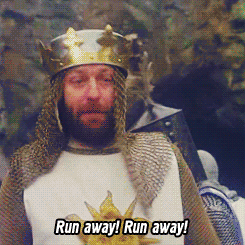

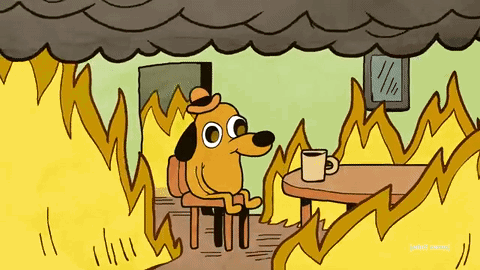

- Python is slow for numerical computation because it performs dynamic dispatch on every operation we perform...

- ...but often, we just want to do the same thing over and over in a loop!

- If we don't need Python's dynamicism, we don't want to pay (much) for it.

- **Idea:** Dispatch **once per operation** instead of **once per element**.

In [687]:
import numpy as np

data = np.array([1, 2, 3, 4])
data

array([1, 2, 3, 4])

**My own example 25**

In [688]:
data_2 = np.array([5, 6, 7, 8])
data_2

array([5, 6, 7, 8])

In [689]:
data + data

array([2, 4, 6, 8])

**My own example 26**

In [690]:
data_2 + data_2

array([10, 12, 14, 16])

In [691]:
%%time
# Naive dot product
(array_data * array_data).sum()

CPU times: user 535 µs, sys: 26 µs, total: 561 µs
Wall time: 572 µs


333328333350000.0

**My own example 27**

In [692]:
%%time
(array_data_2 * array_data_2).sum()

CPU times: user 600 µs, sys: 0 ns, total: 600 µs
Wall time: 612 µs


333328333350000.0

In [693]:
%%time
# Built-in dot product.
array_data.dot(array_data)

CPU times: user 289 µs, sys: 15 µs, total: 304 µs
Wall time: 212 µs


333328333350000.0

**My own example 28**

In [694]:
%%time
# Built-in dot product.
array_data_2.dot(array_data_2)

CPU times: user 0 ns, sys: 757 µs, total: 757 µs
Wall time: 676 µs


333328333350000.0

In [695]:
%%time
fortran_dot_product(array_data, array_data)

CPU times: user 593 µs, sys: 0 ns, total: 593 µs
Wall time: 578 µs


333328333350000.0

**My own example 29**

In [696]:
%%time
fortran_dot_product(array_data_2, array_data_2)

CPU times: user 185 µs, sys: 9 µs, total: 194 µs
Wall time: 203 µs


333328333350000.0

In [697]:
# Numpy won't allow us to write a string into an int array.
#data[0] = "foo"

**My own example 30**

In [698]:
#data_2[0] = "too"

In [699]:
# We also can't grow an array once it's created.
#data.append(3)

**My own example 31**

In [700]:
#data_2.append(9)

In [701]:
# We **can** reshape an array though.
two_by_two = data.reshape(2, 2)
two_by_two

array([[1, 2],
       [3, 4]])

**My own example 32**

In [702]:
two_by_two_2 = data_2.reshape(2, 2)
two_by_two_2

array([[5, 6],
       [7, 8]])

Numpy arrays are:

- Fixed-type

- Size-immutable

- Multi-dimensional

- Fast\*

\* If you use them correctly.

# What's in an Array?

In [703]:
arr = np.array([1, 2, 3, 4, 5, 6], dtype='int16').reshape(2, 3)
print("Array:\n", arr, sep='')
print("===========")
print("DType:", arr.dtype)
print("Shape:", arr.shape)
print("Strides:", arr.strides)
print("Data:", arr.data.tobytes())

Array:
[[1 2 3]
 [4 5 6]]
DType: int16
Shape: (2, 3)
Strides: (6, 2)
Data: b'\x01\x00\x02\x00\x03\x00\x04\x00\x05\x00\x06\x00'


**My own example 33**

In [704]:
arr_1 = np.array([7, 8, 9, 10, 11, 12], dtype='int16').reshape(2, 3)
print("Array:\n", arr_1, sep='')
print("===========")
print("DType:", arr_1.dtype)
print("Shape:", arr_1.shape)
print("Strides:", arr_1.strides)
print("Data:", arr_1.data.tobytes())

Array:
[[ 7  8  9]
 [10 11 12]]
DType: int16
Shape: (2, 3)
Strides: (6, 2)
Data: b'\x07\x00\x08\x00\t\x00\n\x00\x0b\x00\x0c\x00'


# Core Operations

- Vectorized **ufuncs** for elementwise operations.
- Fancy indexing and masking for selection and filtering.
- Aggregations across axes.
- Broadcasting

# UFuncs

UFuncs (universal functions) are functions that operate elementwise on one or more arrays.

In [705]:
data = np.arange(15).reshape(3, 5)
data

array([[ 0,  1,  2,  3,  4],
       [ 5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14]])

**My own example 34**

In [706]:
data_1 = np.arange(20).reshape(5, 4)
data_1

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11],
       [12, 13, 14, 15],
       [16, 17, 18, 19]])

In [707]:
# Binary operators.
data * data

array([[  0,   1,   4,   9,  16],
       [ 25,  36,  49,  64,  81],
       [100, 121, 144, 169, 196]])

**My own example 35**

In [708]:
data_1 * data_1

array([[  0,   1,   4,   9],
       [ 16,  25,  36,  49],
       [ 64,  81, 100, 121],
       [144, 169, 196, 225],
       [256, 289, 324, 361]])

In [709]:
# Unary functions.
np.sqrt(data)

array([[0.        , 1.        , 1.41421356, 1.73205081, 2.        ],
       [2.23606798, 2.44948974, 2.64575131, 2.82842712, 3.        ],
       [3.16227766, 3.31662479, 3.46410162, 3.60555128, 3.74165739]])

**My own example 36**

In [710]:
np.sqrt(data_1)

array([[0.        , 1.        , 1.41421356, 1.73205081],
       [2.        , 2.23606798, 2.44948974, 2.64575131],
       [2.82842712, 3.        , 3.16227766, 3.31662479],
       [3.46410162, 3.60555128, 3.74165739, 3.87298335],
       [4.        , 4.12310563, 4.24264069, 4.35889894]])

In [711]:
# Comparison operations
(data % 3) == 0

array([[ True, False, False,  True, False],
       [False,  True, False, False,  True],
       [False, False,  True, False, False]])

**My own example 37**

In [712]:
(data_1 % 2) == 0

array([[ True, False,  True, False],
       [ True, False,  True, False],
       [ True, False,  True, False],
       [ True, False,  True, False],
       [ True, False,  True, False]])

In [713]:
# Boolean combinators.
((data % 2) == 0) & ((data % 3) == 0)

array([[ True, False, False, False, False],
       [False,  True, False, False, False],
       [False, False,  True, False, False]])

**My own example 38**

In [714]:
((data_1 % 5) == 0) & ((data_1 % 3) == 0)

array([[ True, False, False, False],
       [False, False, False, False],
       [False, False, False, False],
       [False, False, False,  True],
       [False, False, False, False]])

In [715]:
# as of python 3.5, @ is matrix-multiply
data @ data.T

array([[ 30,  80, 130],
       [ 80, 255, 430],
       [130, 430, 730]])

**My own example 39**

In [716]:
data_1 @ data_1.T

array([[  14,   38,   62,   86,  110],
       [  38,  126,  214,  302,  390],
       [  62,  214,  366,  518,  670],
       [  86,  302,  518,  734,  950],
       [ 110,  390,  670,  950, 1230]])

# UFuncs Review

- UFuncs provide efficient elementwise operations applied across one or more arrays.
- Arithmetic Operators (`+`, `*`, `/`)
- Comparisons (`==`, `>`, `!=`)
- Boolean Operators (`&`, `|`, `^`)
- Trigonometric Functions (`sin`, `cos`)
- Transcendental Functions (`exp`, `log`)

# Selections

We often want to perform an operation on just a subset of our data.

In [717]:
sines = np.sin(np.linspace(0, 3.14, 10))
cosines = np.cos(np.linspace(0, 3.14, 10))
sines

array([0.        , 0.34185385, 0.64251645, 0.86575984, 0.98468459,
       0.98496101, 0.8665558 , 0.64373604, 0.34335012, 0.00159265])

**My own example 40**

In [718]:
sines_1 = np.sin(np.linspace(0, 2.7, 8))
cosines_1 = np.cos(np.linspace(0, 2.7, 8))
sines_1

array([0.        , 0.37622104, 0.69716011, 0.9156584 , 0.99960973,
       0.93667828, 0.73611122, 0.42737988])

In [719]:
# Slicing works with the same semantics as Python lists.
sines[0]

0.0

**My own example 41**

In [720]:
sines_1[4]

0.9996097263886704

In [721]:
sines[:3]  # First three elements  

array([0.        , 0.34185385, 0.64251645])

**My own example 42**

In [722]:
sines_1[:5] 

array([0.        , 0.37622104, 0.69716011, 0.9156584 , 0.99960973])

In [723]:
sines[5:]  # Elements from 5 on.

array([0.98496101, 0.8665558 , 0.64373604, 0.34335012, 0.00159265])

**My own example 43**

In [724]:
sines_1[4:]

array([0.99960973, 0.93667828, 0.73611122, 0.42737988])

In [725]:
sines[::2]  # Every other element.

array([0.        , 0.64251645, 0.98468459, 0.8665558 , 0.34335012])

**My own example 44**

In [726]:
sines_1[::3]

array([0.        , 0.9156584 , 0.73611122])

In [727]:
# More interesting: we can index with boolean arrays to filter by a predicate.
print("sines:\n", sines)
print("sines > 0.5:\n", sines > 0.5)
print("sines[sines > 0.5]:\n", sines[sines > 0.5])

sines:
 [0.         0.34185385 0.64251645 0.86575984 0.98468459 0.98496101
 0.8665558  0.64373604 0.34335012 0.00159265]
sines > 0.5:
 [False False  True  True  True  True  True  True False False]
sines[sines > 0.5]:
 [0.64251645 0.86575984 0.98468459 0.98496101 0.8665558  0.64373604]


**My own example 45**

In [728]:
print("sines_1:\n", sines_1)
print("sines_1 > 0.5:\n", sines_1 > 0.5)
print("sines_1[sines_1 > 0.5]:\n", sines_1[sines_1 > 0.5])

sines_1:
 [0.         0.37622104 0.69716011 0.9156584  0.99960973 0.93667828
 0.73611122 0.42737988]
sines_1 > 0.5:
 [False False  True  True  True  True  True False]
sines_1[sines_1 > 0.5]:
 [0.69716011 0.9156584  0.99960973 0.93667828 0.73611122]


In [729]:
# We index with lists/arrays of integers to select values at those indices.
print(sines)
sines[[0, 4, 7]]

[0.         0.34185385 0.64251645 0.86575984 0.98468459 0.98496101
 0.8665558  0.64373604 0.34335012 0.00159265]


array([0.        , 0.98468459, 0.64373604])

**My own example 46**

In [730]:
print(sines_1)
sines_1[[0, 3, 7]]

[0.         0.37622104 0.69716011 0.9156584  0.99960973 0.93667828
 0.73611122 0.42737988]


array([0.        , 0.9156584 , 0.42737988])

In [731]:
# Index arrays are often used for sorting one or more arrays.
unsorted_data = np.array([1, 3, 2, 12, -1, 5, 2])

**My own example 47**

In [732]:
unsorted_data_1 = np.array([4, 6, 0, -3, 7, 8, -2])

In [733]:
sort_indices = np.argsort(unsorted_data)
sort_indices

array([4, 0, 2, 6, 1, 5, 3])

**My own example 48**

In [734]:
sort_indices_1 = np.argsort(unsorted_data_1)
sort_indices_1

array([3, 6, 2, 0, 1, 4, 5])

In [735]:
unsorted_data[sort_indices]

array([-1,  1,  2,  2,  3,  5, 12])

**My own example 49**

In [736]:
unsorted_data_1[sort_indices_1]

array([-3, -2,  0,  4,  6,  7,  8])

In [737]:
market_caps = np.array([12, 6, 10, 5, 6])  # Presumably in dollars?
assets = np.array(['A', 'B', 'C', 'D', 'E'])

**My own example 50**

In [738]:
market_caps_1 = np.array([20, 40, 60, 80, 100])
assets_1 = np.array(['A', 'B', 'C', 'D', 'E'])

In [739]:
# Sort assets by market cap by using the permutation that would sort market caps on ``assets``.
sort_by_mcap = np.argsort(market_caps)
assets[sort_by_mcap]

array(['D', 'B', 'E', 'C', 'A'], dtype='<U1')

**My own example 51**

In [740]:
sort_by_mcap_1 = np.argsort(market_caps_1)
assets_1[sort_by_mcap_1]

array(['A', 'B', 'C', 'D', 'E'], dtype='<U1')

In [741]:
# Indexers are also useful for aligning data.
print("Dates:\n", repr(event_dates))
print("Values:\n", repr(event_values))
print("Calendar:\n", repr(calendar))

Dates:
 array(['2017-01-06', '2017-01-07', '2017-01-08'], dtype='datetime64[D]')
Values:
 array([10, 15, 20])
Calendar:
 array(['2017-01-03', '2017-01-04', '2017-01-05', '2017-01-06',
       '2017-01-09', '2017-01-10', '2017-01-11', '2017-01-12',
       '2017-01-13', '2017-01-17', '2017-01-18', '2017-01-19',
       '2017-01-20', '2017-01-23', '2017-01-24', '2017-01-25',
       '2017-01-26', '2017-01-27', '2017-01-30', '2017-01-31',
       '2017-02-01'], dtype='datetime64[D]')


**My own example 52**

In [742]:
print("Dates:\n", repr(event_dates_1))
print("Values:\n", repr(event_values_1))
print("Calendar:\n", repr(calendar))

Dates:
 array(['2017-01-09', '2017-01-10', '2017-01-11'], dtype='datetime64[D]')
Values:
 array([10, 15, 20])
Calendar:
 array(['2017-01-03', '2017-01-04', '2017-01-05', '2017-01-06',
       '2017-01-09', '2017-01-10', '2017-01-11', '2017-01-12',
       '2017-01-13', '2017-01-17', '2017-01-18', '2017-01-19',
       '2017-01-20', '2017-01-23', '2017-01-24', '2017-01-25',
       '2017-01-26', '2017-01-27', '2017-01-30', '2017-01-31',
       '2017-02-01'], dtype='datetime64[D]')


In [743]:
print("Raw Dates:", event_dates)
print("Indices:", calendar.searchsorted(event_dates))
print("Forward-Filled Dates:", calendar[calendar.searchsorted(event_dates)])

Raw Dates: ['2017-01-06' '2017-01-07' '2017-01-08']
Indices: [3 4 4]
Forward-Filled Dates: ['2017-01-06' '2017-01-09' '2017-01-09']


**My own example 53**

In [744]:
print("Raw Dates:", event_dates_1)
print("Indices:", calendar.searchsorted(event_dates_1))
print("Forward-Filled Dates:", calendar[calendar.searchsorted(event_dates_1)])

Raw Dates: ['2017-01-09' '2017-01-10' '2017-01-11']
Indices: [4 5 6]
Forward-Filled Dates: ['2017-01-09' '2017-01-10' '2017-01-11']


On multi-dimensional arrays, we can slice along each axis independently.

In [745]:
data = np.arange(25).reshape(5, 5)
data

array([[ 0,  1,  2,  3,  4],
       [ 5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14],
       [15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24]])

**My own example 54**

In [746]:
data_1 = np.arange(16).reshape(4, 4)
data_1

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11],
       [12, 13, 14, 15]])

In [747]:
data[:2, :2]  # First two rows and first two columns.

array([[0, 1],
       [5, 6]])

**My own example 55**

In [748]:
data_1[:3, :2]

array([[0, 1],
       [4, 5],
       [8, 9]])

In [749]:
data[:2, [0, -1]]  # First two rows, first and last columns.

array([[0, 4],
       [5, 9]])

**My own example 56**

In [750]:
data_1[:3, [0, -2]]

array([[ 0,  2],
       [ 4,  6],
       [ 8, 10]])

In [751]:
data[(data[:, 0] % 2) == 0]  # Rows where the first column is divisible by two.

array([[ 0,  1,  2,  3,  4],
       [10, 11, 12, 13, 14],
       [20, 21, 22, 23, 24]])

**My own example 57**

In [752]:
data_1[(data_1[:, 0] % 3) == 0] 

array([[ 0,  1,  2,  3],
       [12, 13, 14, 15]])

# Selections Review

- Indexing with an integer removes a dimension.
- Slicing operations work on Numpy arrays the same way they do on lists.
- Indexing with a boolean array filters to True locations.
- Indexing with an integer array selects indices along an axis.
- Multidimensional arrays can apply selections independently along different axes.

## Reductions

Functions that reduce an array to a scalar.

$Var(X) = \frac{1}{N}\sqrt{\sum_{i=1}^N (x_i - \bar{x})^2}$

In [753]:
def variance(x):
    return ((x - x.mean()) ** 2).sum() / len(x)

In [754]:
variance(np.random.standard_normal(1000))

0.9593187132294667

**My own example 58**

In [755]:
variance(np.random.standard_normal(200))

0.9350125664132177

- `sum()` and `mean()` are both **reductions**.

- In the simplest case, we use these to reduce an entire array into a single value...

In [756]:
data = np.arange(30)
data.mean()

14.5

**My own example 59**

In [757]:
data_1 = np.arange(20)
data_1.mean()

9.5

- ...but we can do more interesting things with multi-dimensional arrays.

In [758]:
data = np.arange(30).reshape(3, 10)
data

array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24, 25, 26, 27, 28, 29]])

**My own example 60**

In [759]:
data_1 = np.arange(20).reshape(2, 10)
data_1

array([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14, 15, 16, 17, 18, 19]])

In [760]:
data.mean()

14.5

**My own example 61**

In [761]:
data_1.mean()

9.5

In [762]:
data.mean(axis=0)

array([10., 11., 12., 13., 14., 15., 16., 17., 18., 19.])

**My own example 62**

In [763]:
data_1.mean(axis=0)

array([ 5.,  6.,  7.,  8.,  9., 10., 11., 12., 13., 14.])

In [764]:
data.mean(axis=1)

array([ 4.5, 14.5, 24.5])

**My own example 63**

In [765]:
data_1.mean(axis=1)

array([ 4.5, 14.5])

## Reductions Review

- Reductions allow us to perform efficient aggregations over arrays.
- We can do aggregations over a single axis to collapse a single dimension.
- Many built-in reductions (`mean`, `sum`, `min`, `max`, `median`, ...).

# Broadcasting

In [766]:
row = np.array([1, 2, 3, 4])
column = np.array([[1], [2], [3]])
print("Row:\n", row, sep='')
print("Column:\n", column, sep='')

Row:
[1 2 3 4]
Column:
[[1]
 [2]
 [3]]


**My own example 64**

In [767]:
row_1 = np.array([5, 6, 7, 8])
column_1 = np.array([[1], [2], [3]])
print("Row:\n", row_1, sep='')
print("Column:\n", column_1, sep='')

Row:
[5 6 7 8]
Column:
[[1]
 [2]
 [3]]


In [768]:
row + column

array([[2, 3, 4, 5],
       [3, 4, 5, 6],
       [4, 5, 6, 7]])

**My own example 65**

In [769]:
row_1 + column_1

array([[ 6,  7,  8,  9],
       [ 7,  8,  9, 10],
       [ 8,  9, 10, 11]])

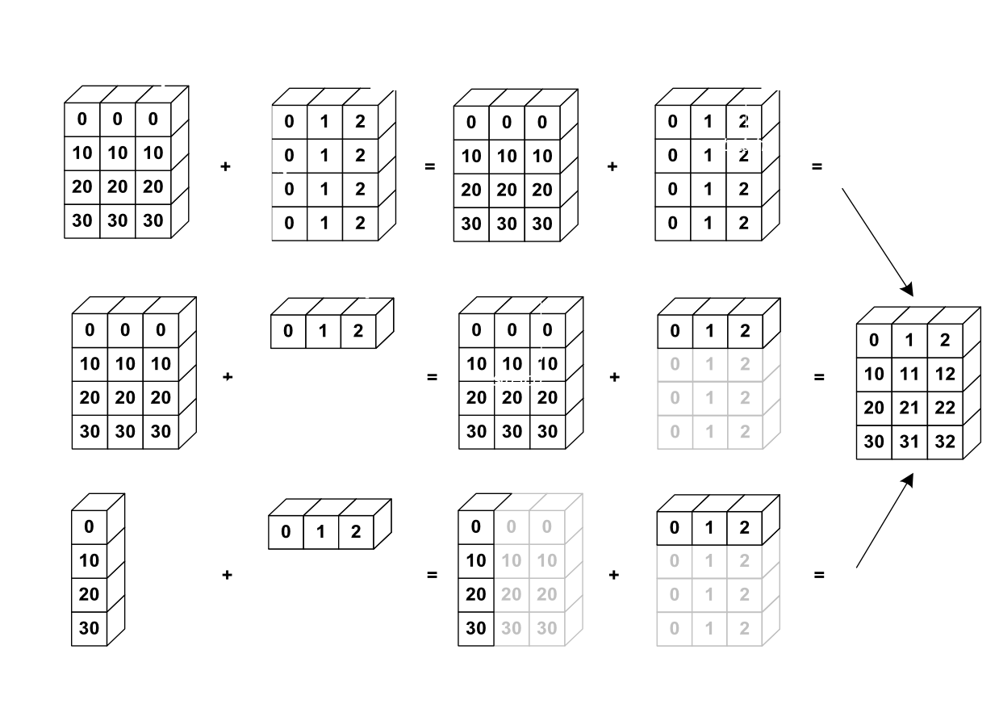

<h5>Source: http://www.scipy-lectures.org/_images/numpy_broadcasting.png</h5>

In [770]:
# Broadcasting is particularly useful in conjunction with reductions.
print("Data:\n", data, sep='')
print("Mean:\n", data.mean(axis=0), sep='')
print("Data - Mean:\n", data - data.mean(axis=0), sep='')

Data:
[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]
 [20 21 22 23 24 25 26 27 28 29]]
Mean:
[10. 11. 12. 13. 14. 15. 16. 17. 18. 19.]
Data - Mean:
[[-10. -10. -10. -10. -10. -10. -10. -10. -10. -10.]
 [  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.]
 [ 10.  10.  10.  10.  10.  10.  10.  10.  10.  10.]]


**My own example 66**

In [771]:
print("Data:\n", data_1, sep='')
print("Mean:\n", data_1.mean(axis=0), sep='')
print("Data - Mean:\n", data_1 - data_1.mean(axis=0), sep='')

Data:
[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]]
Mean:
[ 5.  6.  7.  8.  9. 10. 11. 12. 13. 14.]
Data - Mean:
[[-5. -5. -5. -5. -5. -5. -5. -5. -5. -5.]
 [ 5.  5.  5.  5.  5.  5.  5.  5.  5.  5.]]


# Broadcasting Review

- Numpy operations can work on arrays of different dimensions as long as the arrays' shapes are still "compatible".
- Broadcasting works by "tiling" the smaller array along the missing dimension.
- The result of a broadcasted operation is always at least as large in each dimension as the largest array in that dimension.

# Numpy Review

- Numerical algorithms are slow in pure Python because the overhead dynamic dispatch dominates our runtime.

- Numpy solves this problem by:
  1. Imposing additional restrictions on the contents of arrays.
  2. Moving the inner loops of our algorithms into compiled C code.

- Using Numpy effectively often requires reworking an algorithms to use vectorized operations instead of for-loops, but the resulting operations are usually simpler, clearer, and faster than the pure Python equivalent.

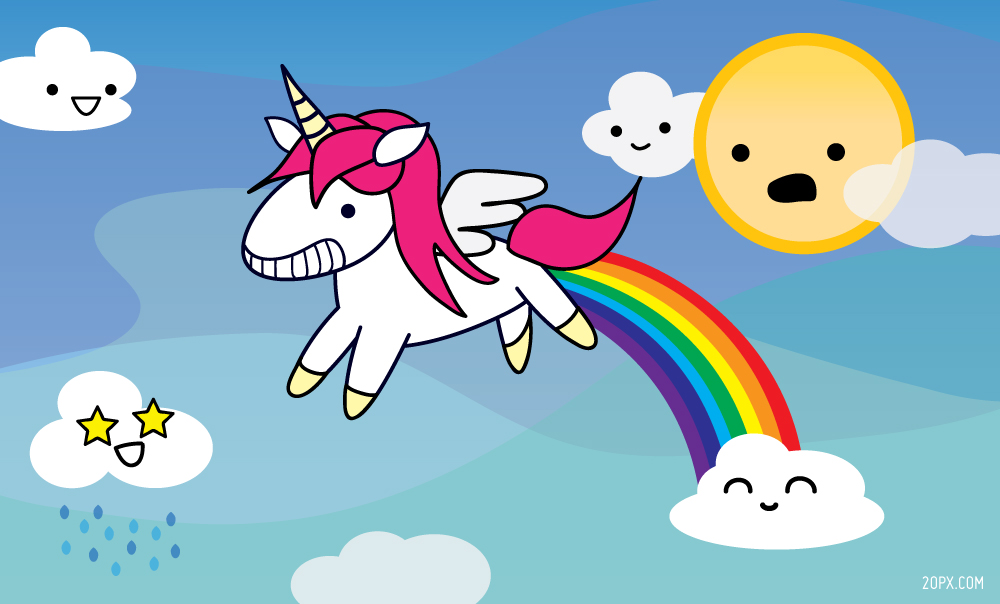

Numpy is great for many things, but...

- Sometimes our data is equipped with a natural set of **labels**:
  - Dates/Times
  - Stock Tickers
  - Field Names (e.g. Open/High/Low/Close)

- Sometimes we have **more than one type of data** that we want to keep grouped together.
  - Tables with a mix of real-valued and categorical data.

- Sometimes we have **missing** data, which we need to ignore, fill, or otherwise work around.

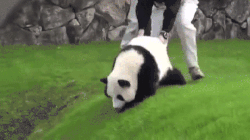

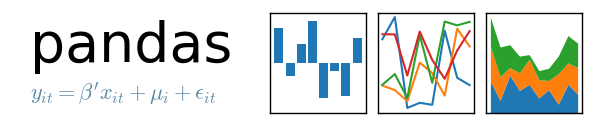


Pandas extends Numpy with more complex data structures:

- `Series`: 1-dimensional, homogenously-typed, labelled array.
- `DataFrame`: 2-dimensional, semi-homogenous, labelled table.

Pandas also provides many utilities for: 
- Input/Output
- Data Cleaning
- Rolling Algorithms
- Plotting

# Selection in Pandas

In [772]:
s = pd.Series(index=['a', 'b', 'c', 'd', 'e'], data=[1, 2, 3, 4, 5])
s

a    1
b    2
c    3
d    4
e    5
dtype: int64

**My own example 67**

In [773]:
s_1 = pd.Series(index=['lunes', 'martes', 'miercoles', 'jueves', 'viernes'], data=[1, 2, 3, 4, 5])
s_1

lunes        1
martes       2
miercoles    3
jueves       4
viernes      5
dtype: int64

In [774]:
# There are two pieces to a Series: the index and the values.
print("The index is:", s.index)
print("The values are:", s.values)

The index is: Index(['a', 'b', 'c', 'd', 'e'], dtype='object')
The values are: [1 2 3 4 5]


**My own example 68**

In [775]:
print("The index is:", s_1.index)
print("The values are:", s_1.values)

The index is: Index(['lunes', 'martes', 'miercoles', 'jueves', 'viernes'], dtype='object')
The values are: [1 2 3 4 5]


In [776]:
# We can look up values out of a Series by position...
s.iloc[0]

1

**My own example 69**

In [777]:
s_1.iloc[3]

4

In [778]:
# ... or by label.
s.loc['a']

1

**My own example 70**

In [779]:
s_1.loc['miercoles']

3

In [780]:
# Slicing works as expected...
s.iloc[:2]

a    1
b    2
dtype: int64

**My own example 71**

In [781]:
s_1.iloc[:3]

lunes        1
martes       2
miercoles    3
dtype: int64

In [782]:
# ...but it works with labels too!
s.loc[:'c']

a    1
b    2
c    3
dtype: int64

**My own example 72**

In [783]:
s_1.loc[:'martes']

lunes     1
martes    2
dtype: int64

In [784]:
# Fancy indexing works the same as in numpy.
s.iloc[[0, -1]]

a    1
e    5
dtype: int64

**My own example 73**

In [785]:
s_1.iloc[[0, -1]]

lunes      1
viernes    5
dtype: int64

In [786]:
# As does boolean masking.
s.loc[s > 2]

c    3
d    4
e    5
dtype: int64

**My own example 74**

In [787]:
s_1.loc[s_1 > 3]

jueves     4
viernes    5
dtype: int64

In [788]:
# Element-wise operations are aligned by index.
other_s = pd.Series({'a': 10.0, 'c': 20.0, 'd': 30.0, 'z': 40.0})
other_s

a    10.0
c    20.0
d    30.0
z    40.0
dtype: float64

**My own example 75**

In [789]:
other_s_1 = pd.Series({'a': 15.0, 'e': 18.0, 'i': 27.0, 'o': 67.0, 'u': 82.0})
other_s_1

a    15.0
e    18.0
i    27.0
o    67.0
u    82.0
dtype: float64

In [790]:
s + other_s

a    11.0
b     NaN
c    23.0
d    34.0
e     NaN
z     NaN
dtype: float64

**My own example 76**

In [791]:
s_1 + other_s_1

a           NaN
e           NaN
i           NaN
jueves      NaN
lunes       NaN
martes      NaN
miercoles   NaN
o           NaN
u           NaN
viernes     NaN
dtype: float64

In [792]:
# We can fill in missing values with fillna().
(s + other_s).fillna(0.0)

a    11.0
b     0.0
c    23.0
d    34.0
e     0.0
z     0.0
dtype: float64

**My own example 77**

In [793]:
(s_1 + other_s_1).fillna(0.0)

a            0.0
e            0.0
i            0.0
jueves       0.0
lunes        0.0
martes       0.0
miercoles    0.0
o            0.0
u            0.0
viernes      0.0
dtype: float64

In [794]:
!pip install yfinance

In [795]:
import yfinance as yf 

In [796]:
# Most real datasets are read in from an external file format.
#aapl = pd.read_csv('AAPL.csv', parse_dates=['Date'], index_col='Date')
aapl = yf.download("AAPL", start = "2013-01-01" , end ="2013-12-01")
aapl.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-01-02,19.779285,19.821428,19.343929,19.608213,16.939117,560518000
2013-01-03,19.567142,19.631071,19.321428,19.360714,16.725306,352965200
2013-01-04,19.177500,19.236786,18.779642,18.821428,16.259426,594333600
2013-01-07,18.642857,18.903570,18.400000,18.710714,16.163784,484156400
2013-01-08,18.900356,18.996071,18.616072,18.761070,16.207283,458707200


**My own example 78**

In [797]:
goog = yf.download("GOOG", start = "2013-01-01" , end ="2013-12-01")
goog.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2013-01-02,358.366760,362.142609,356.937103,360.274597,360.274597,5101651
2013-01-03,361.111481,364.598389,359.014313,360.483826,360.483826,4653778
2013-01-04,363.308228,369.350586,362.481323,367.607117,367.607117,5547717
2013-01-07,366.351837,368.309479,363.925903,366.003143,366.003143,3323812
2013-01-08,366.396667,366.775238,360.862396,365.280823,365.280823,3364765


In [798]:
# Slicing generalizes to two dimensions as you'd expect:
aapl.iloc[:2, :2]

,Open,High
Date,,
2013-01-02,19.779285,19.821428
2013-01-03,19.567142,19.631071


**My own example 79**

In [799]:
goog.iloc[:2, :2]

,Open,High
Date,,
2013-01-02,358.366760,362.142609
2013-01-03,361.111481,364.598389


In [800]:
aapl.loc[pd.Timestamp('2013-02-01'):pd.Timestamp('2013-02-04'), ['Close', 'Volume']]

,Close,Volume
Date,,
2013-02-01,16.200714,539484400
2013-02-04,15.797143,477117200


**My own example 80**

In [801]:
goog.loc[pd.Timestamp('2013-02-01'):pd.Timestamp('2013-02-04'), ['Close', 'Volume']]

,Close,Volume
Date,,
2013-02-01,386.351868,7520283
2013-02-04,378.092804,6103793


# Rolling Operations

<center><img src="images/rolling.gif" alt="Drawing" style="width: 75%;"/></center>

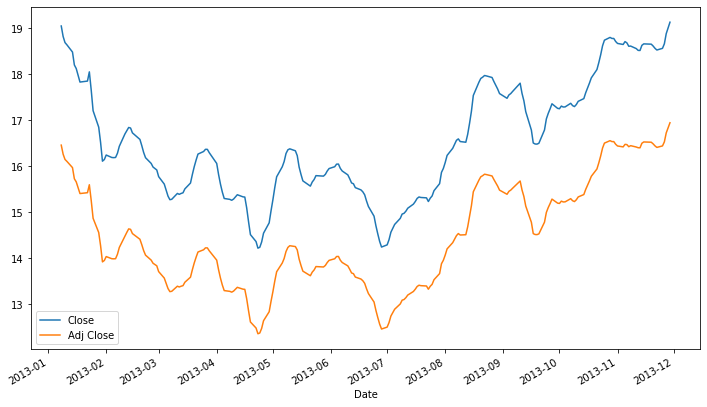

In [802]:
aapl.rolling(5)[['Close', 'Adj Close']].mean().plot();

**My own example 81**

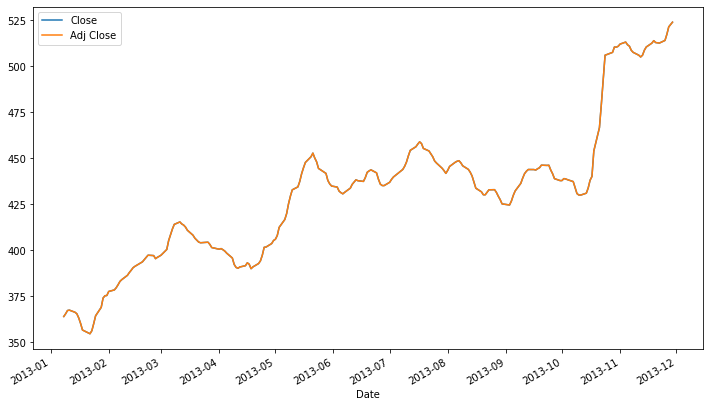

In [803]:
goog.rolling(5)[['Close', 'Adj Close']].mean().plot();

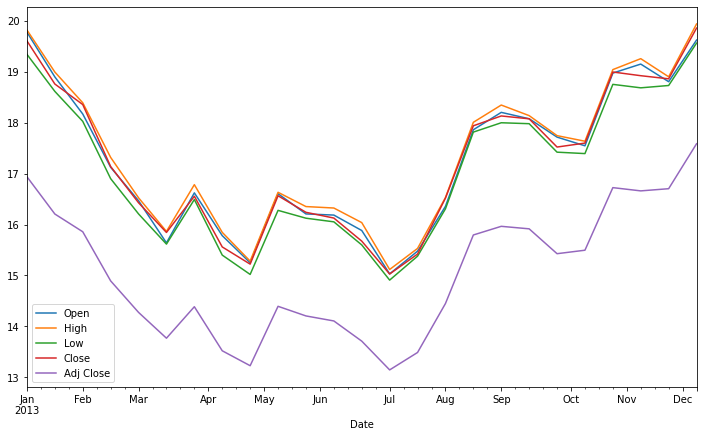

In [804]:
# Drop `Volume`, since it's way bigger than everything else.
aapl.drop('Volume', axis=1).resample('2W').max().plot();

**My own example 82**

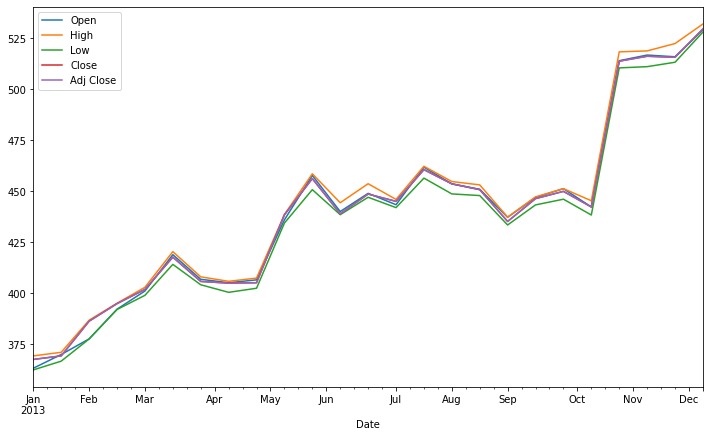

In [805]:
goog.drop('Volume', axis=1).resample('2W').max().plot();

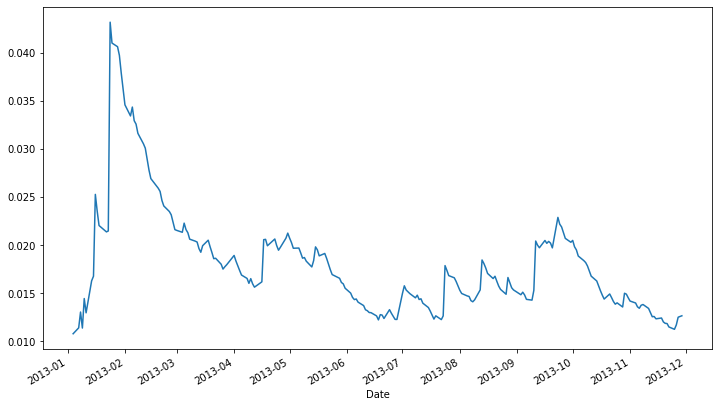

In [806]:
# 30-day rolling exponentially-weighted stddev of returns.
aapl['Close'].pct_change().ewm(span=30).std().plot();

**My own example 83**

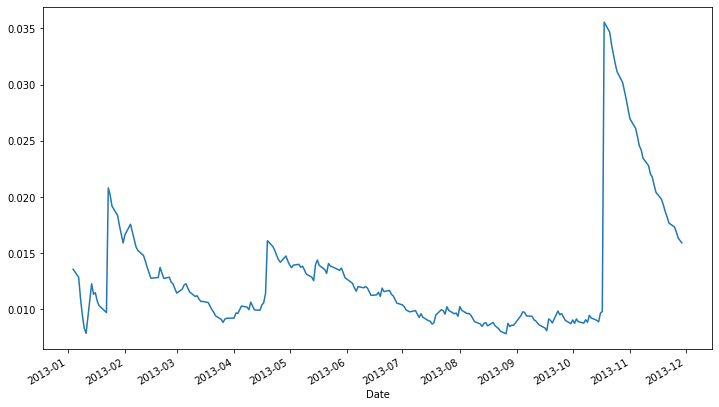

In [807]:
goog['Close'].pct_change().ewm(span=30).std().plot();

# "Real World" Data

In [808]:
!git clone https://github.com/ssanderson/pydata-toolbox

fatal: destination path 'pydata-toolbox' already exists and is not an empty directory.


In [809]:
!git clone <urlOfRepository>

/bin/bash: -c: line 0: syntax error near unexpected token `newline'
/bin/bash: -c: line 0: `git clone <urlOfRepository>'


In [810]:
!pip install githubdl

In [811]:
!githubdl -u https://github.com/ssanderson/pydata-toolbox -d demos -g 0260ccdcf10212d2a8f1d9ff6fbc7e55b00a4ad2

2022-04-19 09:43:30,025 - root         - INFO     - Retrieving a list of files for directory: demos
2022-04-19 09:43:30,025 - root         - INFO     - repo_name: ssanderson/pydata-toolbox api_path: contents request_string: /demos
2022-04-19 09:43:30,026 - root         - INFO     - Requesting file: demos at url: https://api.github.com/repos/ssanderson/pydata-toolbox/contents/demos
2022-04-19 09:43:30,132 - root         - CRITICAL - Unable to retrieve list of files from response.
 Exception: 'str' object has no attribute 'get'
 Response: {'message': 'Bad credentials', 'documentation_url': 'https://docs.github.com/rest'}
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/githubdl/request_processing.py", line 21, in get_files_from_json
    files.update({item.get("name"): item.get("type")})
AttributeError: 'str' object has no attribute 'get'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/l

In [812]:
from io import BytesIO
import os
from urllib.parse import urlencode

import requests
import numpy as np
import pandas as pd


def read_avocadata(start_date, end_date, cache_loc='avocadata.html'):
    """Download avocado data to a dataframe.
    Parameters
    ----------
    """
    start_date = pd.Timestamp(start_date)
    end_date = pd.Timestamp(end_date)
    base_url = 'https://www.marketnews.usda.gov/mnp/fv-report-retail'
    query_params = {
        'class': ['FRUITS'],
        'commodity': ['AVOCADOS'],
        'compareLy': ['No'],
        'endDate': [end_date.strftime("%m/%d/%Y")],
        'format': ['excel'],
        'organic': ['ALL'],
        'portal': ['fv'],
        'region': ['ALL'],
        'repDate': [start_date.strftime("%m/%d/%Y")],
        'type': ['retail'],
    }

    url = base_url + '?' + urlencode(query_params, doseq=1)

    if not os.path.exists(cache_loc):
        resp = requests.get(url, stream=True)
        resp.raise_for_status()

        with open(cache_loc, 'wb') as f:
            for block in resp.iter_content(chunk_size=4096):
                f.write(block)
        f.close()

    with open(cache_loc, 'rb') as f:
        frame = pd.read_html(f, header=0)[0]

    # Cleanup
    frame = frame[frame['Unit'] == 'each']
    frame['Organic'] = (frame['Organic'] == 'Y')
    frame['Variety'].replace(
        {'VARIOUS GREENSKIN VARIETIES': 'GREENSKIN'},
        inplace=True,
    )
    frame['Date'] = pd.to_datetime(frame['Date'].values, utc=True)

    frame['Region'] = frame['Region'].str.replace(' U.S.', '')
    frame['Region'] = frame['Region'].str.replace(' ', '_')

    # Drop useless columns.
    return frame.drop(
        ['Class', 'Commodity', 'Environment', 'Unit', '% Marked Local'],
        axis=1,
    )
    

In [813]:
#from avocados import read_avocadata

avocados = read_avocadata('2014', '2016')
avocados.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: FutureWarning: The default value of regex will change from True to False in a future version.


,Date,Region,Variety,Organic,Number of Stores,Weighted Avg Price,Low Price,High Price
0,2014-01-03 00:00:00+00:00,NATIONAL,HASS,False,9184,0.93,NaN,NaN
1,2014-01-03 00:00:00+00:00,NATIONAL,HASS,True,872,1.44,NaN,NaN
2,2014-01-03 00:00:00+00:00,NORTHEAST,HASS,False,1449,1.08,0.5,1.67
3,2014-01-03 00:00:00+00:00,NORTHEAST,HASS,True,66,1.54,1.5,2.00
4,2014-01-03 00:00:00+00:00,SOUTHEAST,HASS,False,2286,0.98,0.5,1.99


**My own example 84**

In [814]:
avocados_1 = read_avocadata('2012', '2015')
avocados_1.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: FutureWarning: The default value of regex will change from True to False in a future version.


,Date,Region,Variety,Organic,Number of Stores,Weighted Avg Price,Low Price,High Price
0,2014-01-03 00:00:00+00:00,NATIONAL,HASS,False,9184,0.93,NaN,NaN
1,2014-01-03 00:00:00+00:00,NATIONAL,HASS,True,872,1.44,NaN,NaN
2,2014-01-03 00:00:00+00:00,NORTHEAST,HASS,False,1449,1.08,0.5,1.67
3,2014-01-03 00:00:00+00:00,NORTHEAST,HASS,True,66,1.54,1.5,2.00
4,2014-01-03 00:00:00+00:00,SOUTHEAST,HASS,False,2286,0.98,0.5,1.99


In [815]:
# Unlike numpy arrays, pandas DataFrames can have a different dtype for each column.
avocados.dtypes

Date                  datetime64[ns, UTC]
Region                             object
Variety                            object
Organic                              bool
Number of Stores                    int64
Weighted Avg Price                float64
Low Price                         float64
High Price                        float64
dtype: object

**My own example 85**

In [816]:
avocados_1.dtypes

Date                  datetime64[ns, UTC]
Region                             object
Variety                            object
Organic                              bool
Number of Stores                    int64
Weighted Avg Price                float64
Low Price                         float64
High Price                        float64
dtype: object

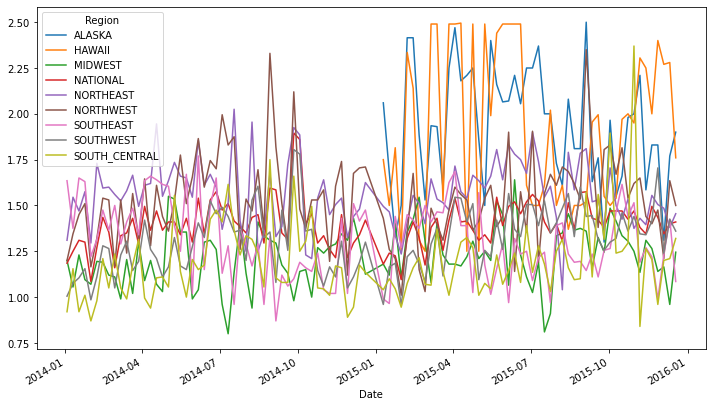

In [817]:
# What's the regional average price of a HASS avocado every day?
hass = avocados[avocados.Variety == 'HASS']
hass.groupby(['Date', 'Region'])['Weighted Avg Price'].mean().unstack().ffill().plot();

**My own example 86**

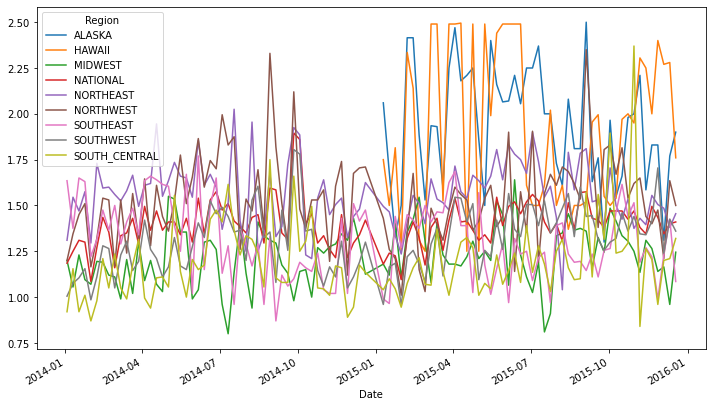

In [818]:
hass_1 = avocados[avocados_1.Variety == 'HASS']
hass_1.groupby(['Date', 'Region'])['Weighted Avg Price'].mean().unstack().ffill().plot();

In [819]:
def _organic_spread(group):

    if len(group.columns) != 2:
        return pd.Series(index=group.index, data=0.0)
    
    is_organic = group.columns.get_level_values('Organic').values.astype(bool)
    organics = group.loc[:, is_organic].squeeze()
    non_organics = group.loc[:, ~is_organic].squeeze()
    diff = organics - non_organics
    return diff

def organic_spread_by_region(df):
    """What's the difference between the price of an organic 
    and non-organic avocado within each region?
    """
    return (
        df
        .set_index(['Date', 'Region', 'Organic'])
         ['Weighted Avg Price']
        .unstack(level=['Region', 'Organic'])
        .ffill()
        .groupby(level='Region', axis=1)
        .apply(_organic_spread)
    )

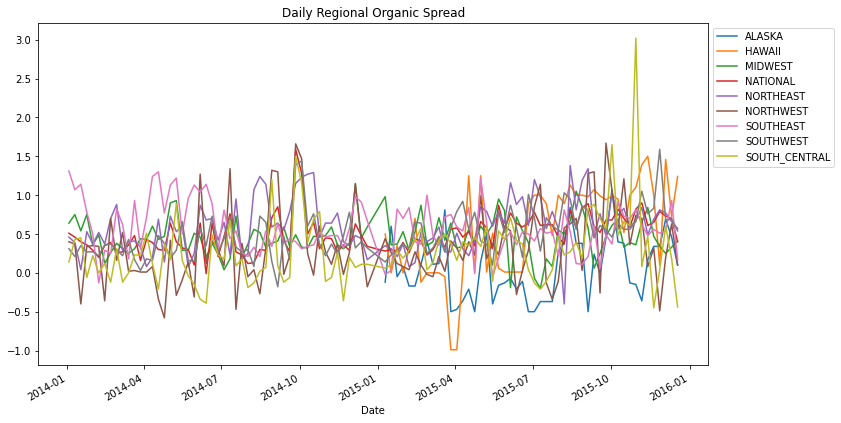

In [820]:
organic_spread_by_region(hass).plot();
plt.gca().set_title("Daily Regional Organic Spread");
plt.legend(bbox_to_anchor=(1, 1));

**My own example 87**

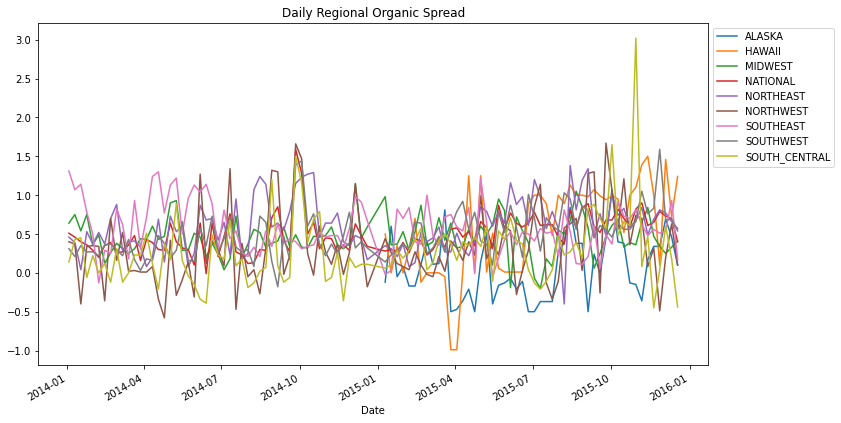

In [821]:
organic_spread_by_region(hass_1).plot();
plt.gca().set_title("Daily Regional Organic Spread");
plt.legend(bbox_to_anchor=(1, 1));

In [822]:
spread_correlation = organic_spread_by_region(hass).corr()
spread_correlation

Region,ALASKA,HAWAII,MIDWEST,NATIONAL,NORTHEAST,NORTHWEST,SOUTHEAST,SOUTHWEST,SOUTH_CENTRAL
Region,,,,,,,,,
ALASKA,1.000000,0.202723,0.175251,0.007844,0.051049,0.087575,0.129079,-0.070868,0.161624
HAWAII,0.202723,1.000000,-0.021116,0.373914,0.247171,0.341155,0.019388,0.159192,0.092632
MIDWEST,0.175251,-0.021116,1.000000,0.062595,-0.010213,-0.043783,0.047437,-0.059128,0.068902
NATIONAL,0.007844,0.373914,0.062595,1.000000,0.502035,0.579102,-0.040539,0.635006,0.486524
NORTHEAST,0.051049,0.247171,-0.010213,0.502035,1.000000,0.242039,-0.236225,0.360389,0.149881
NORTHWEST,0.087575,0.341155,-0.043783,0.579102,0.242039,1.000000,-0.032306,0.165992,0.349935
SOUTHEAST,0.129079,0.019388,0.047437,-0.040539,-0.236225,-0.032306,1.000000,-0.167631,-0.021176
SOUTHWEST,-0.070868,0.159192,-0.059128,0.635006,0.360389,0.165992,-0.167631,1.000000,0.254504
SOUTH_CENTRAL,0.161624,0.092632,0.068902,0.486524,0.149881,0.349935,-0.021176,0.254504,1.000000


**My own example 88**

In [823]:
spread_correlation_1 = organic_spread_by_region(hass_1).corr()
spread_correlation_1

Region,ALASKA,HAWAII,MIDWEST,NATIONAL,NORTHEAST,NORTHWEST,SOUTHEAST,SOUTHWEST,SOUTH_CENTRAL
Region,,,,,,,,,
ALASKA,1.000000,0.202723,0.175251,0.007844,0.051049,0.087575,0.129079,-0.070868,0.161624
HAWAII,0.202723,1.000000,-0.021116,0.373914,0.247171,0.341155,0.019388,0.159192,0.092632
MIDWEST,0.175251,-0.021116,1.000000,0.062595,-0.010213,-0.043783,0.047437,-0.059128,0.068902
NATIONAL,0.007844,0.373914,0.062595,1.000000,0.502035,0.579102,-0.040539,0.635006,0.486524
NORTHEAST,0.051049,0.247171,-0.010213,0.502035,1.000000,0.242039,-0.236225,0.360389,0.149881
NORTHWEST,0.087575,0.341155,-0.043783,0.579102,0.242039,1.000000,-0.032306,0.165992,0.349935
SOUTHEAST,0.129079,0.019388,0.047437,-0.040539,-0.236225,-0.032306,1.000000,-0.167631,-0.021176
SOUTHWEST,-0.070868,0.159192,-0.059128,0.635006,0.360389,0.165992,-0.167631,1.000000,0.254504
SOUTH_CENTRAL,0.161624,0.092632,0.068902,0.486524,0.149881,0.349935,-0.021176,0.254504,1.000000


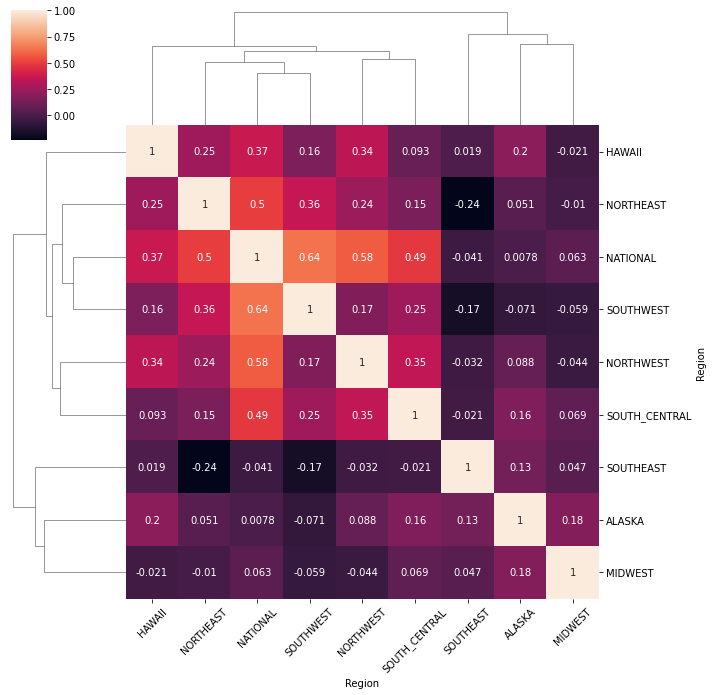

In [824]:
import seaborn as sns
grid = sns.clustermap(spread_correlation, annot=True)
fig = grid.fig
axes = fig.axes
ax = axes[2]
ax.set_xticklabels(ax.get_xticklabels(), rotation=45);

**My own example 89**

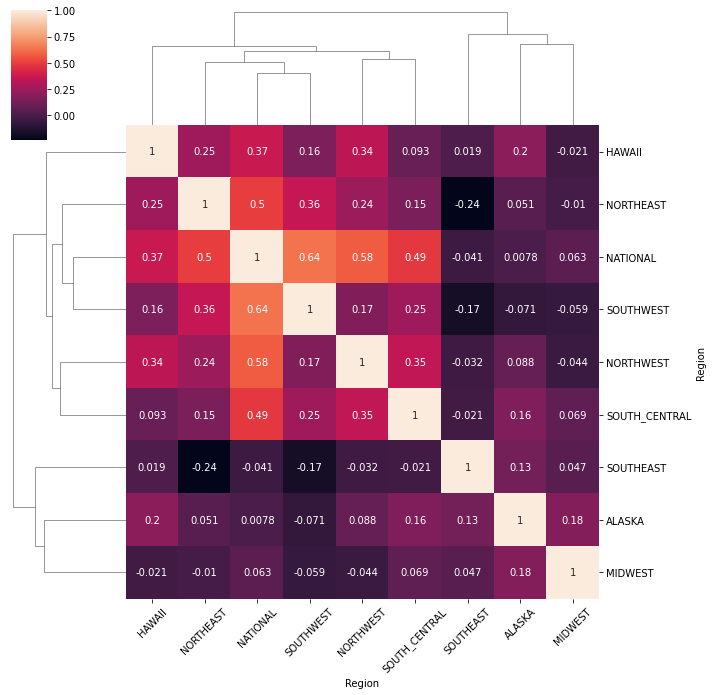

In [825]:
grid = sns.clustermap(spread_correlation_1, annot=True)
fig = grid.fig
axes = fig.axes
ax = axes[2]
ax.set_xticklabels(ax.get_xticklabels(), rotation=45);

# Pandas Review

- Pandas extends numpy with more complex datastructures and algorithms.
- If you understand numpy, you understand 90% of pandas.
- `groupby`, `set_index`, and `unstack` are powerful tools for working with categorical data.
- Avocado prices are surprisingly interesting :)

# Thanks!